# Data Assessment & Analytics for Water Right and Time Series Water Use
Notes:
- change os directory location
- be aware of the number of provdied native source data files
- beware of of what data is available

In [1]:
import os
import sys
print(os.environ['CONDA_DEFAULT_ENV'])
print(sys.version)
print(sys.executable)

wade_data_project
3.13.5 | packaged by conda-forge | (main, Jun 16 2025, 08:20:19) [MSC v.1943 64 bit (AMD64)]
C:\Users\rjame\anaconda3\envs\wade_data_project\python.exe


In [2]:
# Needed Libraries / Modules

# ---- working with data ----
import os  # native operating system interaction
import numpy as np  # mathematical array manipulation
import pandas as pd  # data structure and data analysis
import geopandas as gpd  # geo-data structure and data analysis

# ---- visualization ----
import geoplot as gplt  # for plotting maps and geo-data
import geoplot.crs as gcrs  #used to pull in webdata related to maps and geo-data
import missingno as msno # creates a matrix chart to show missing values
import plotly.express as px
import plotly.graph_objects as go  # for subplot creation
from plotly.subplots import make_subplots  # for subplot creation
import matplotlib.pyplot as mplt  # use with gplt to save fig to pdf

# ---- cleanup ----
import re # string regular expression manipulation
from datetime import datetime # date and time manipulation
pd.set_option('display.max_columns', 999)  # How to display all columns of a Pandas DataFrame in Jupyter Notebook
pd.set_option('display.float_format', lambda x: '%.5f' % x) # suppress scientific notation in Pandas

In [3]:
# ---- working directory ----
workingDirString = os.getcwd() # set working directory folder string here
os.chdir(workingDirString)
print(f'The working Directory is:', workingDirString)

The working Directory is: C:\Users\rjame\Documents\WSWC Documents\MappingStatesDataToWaDE2.0\Washington\WaterAllocation


In [4]:
# ---- where to find input files ----
InputFolderString = "G:/Shared drives/WaDE Data/WaDE Data Folder/Washington/WaterAllocation"  # set this to where input files are located

In [5]:
# Native Input Data
#################################################################
# ---- This needs to be custom per state ----

# Data Set 1: D_Point
dfin1 = pd.read_csv(InputFolderString + '/RawInputData/D_Point.zip')

# Data Set 2: smWR_Doc_POU1
dfin2 = pd.read_csv(InputFolderString + '/RawInputData/WR_Doc_POU1.zip')

C:\Users\rjame\AppData\Local\Temp\ipykernel_20160\1992337635.py:6: DtypeWarning: Columns (6,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  dfin1 = pd.read_csv(InputFolderString + '/RawInputData/D_Point.zip')
C:\Users\rjame\AppData\Local\Temp\ipykernel_20160\1992337635.py:9: DtypeWarning: Columns (8,9,13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  dfin2 = pd.read_csv(InputFolderString + '/RawInputData/WR_Doc_POU1.zip')


In [6]:
# WaDE Processed Input Data
#################################################################

dfm = pd.read_csv(InputFolderString + "/ProcessedInputData/methods.csv", encoding = "ISO-8859-1").replace(np.nan, "")

dfv = pd.read_csv(InputFolderString + "/ProcessedInputData/variables.csv", encoding = "ISO-8859-1").replace(np.nan, "")

dfo = pd.read_csv(InputFolderString + "/ProcessedInputData/organizations.csv", encoding = "ISO-8859-1").replace(np.nan, "")

dfws = pd.read_csv(InputFolderString + "/ProcessedInputData/watersources.csv").replace(np.nan, "")
dfwspurge = pd.read_csv(InputFolderString + "/ProcessedInputData/watersources_missing.csv").replace(np.nan, "")

dfs = pd.read_csv(InputFolderString + "/ProcessedInputData/sites.csv").replace(np.nan, "")
dfspurge = pd.read_csv(InputFolderString + "/ProcessedInputData/sites_missing.csv").replace(np.nan, "")

dfaa = pd.read_csv(InputFolderString + "/ProcessedInputData/waterallocations.csv").replace(np.nan, "")
dfaapurge = pd.read_csv(InputFolderString + "/ProcessedInputData/waterallocations_missing.csv").replace(np.nan, "")

C:\Users\rjame\AppData\Local\Temp\ipykernel_20160\2041931760.py:13: DtypeWarning: Columns (1,7) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = pd.read_csv(InputFolderString + "/ProcessedInputData/sites.csv").replace(np.nan, "")
C:\Users\rjame\AppData\Local\Temp\ipykernel_20160\2041931760.py:14: DtypeWarning: Columns (8,12,13,24) have mixed types. Specify dtype option on import or set low_memory=False.
  dfspurge = pd.read_csv(InputFolderString + "/ProcessedInputData/sites_missing.csv").replace(np.nan, "")
C:\Users\rjame\AppData\Local\Temp\ipykernel_20160\2041931760.py:17: DtypeWarning: Columns (14,18,23,32,41) have mixed types. Specify dtype option on import or set low_memory=False.
  dfaapurge = pd.read_csv(InputFolderString + "/ProcessedInputData/waterallocations_missing.csv").replace(np.nan, "")


# Water Source Info (watersources.csv)

In [7]:
print(len(dfws))
dfws.head(1)

4


,WaterSourceUUID,Geometry,GNISFeatureNameCV,WaterQualityIndicatorCV,WaterSourceName,WaterSourceNativeID,WaterSourceTypeCV
0,WAwr_WwadeId1,,,Fresh,WaDE Blank,wadeId1,Groundwater


<Axes: >

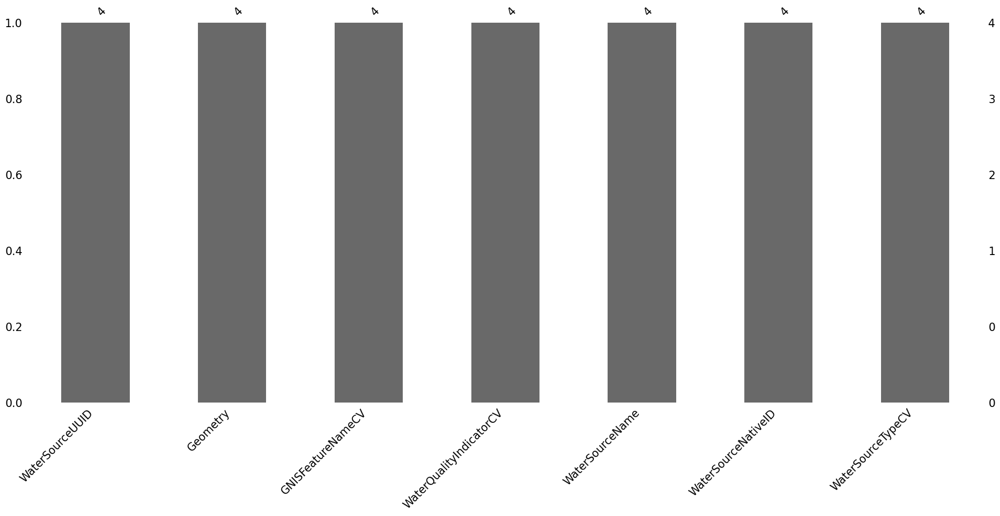

In [8]:
# Check what columns contain missing information.
msno.bar(dfws)

In [9]:
# Unique values for 'WaterSourceTypeCV'
for x in dfws['WaterSourceTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"Groundwater",
"Reservoir",
"Surface Water",
"WaDE Unspecified",


# Site Info (sites.csv)

In [10]:
print(len(dfs))
dfs.head(1)

151781


,SiteUUID,OverlayUUIDs,WaterSourceUUIDs,CoordinateAccuracy,CoordinateMethodCV,County,EPSGCodeCV,Geometry,GNISCodeCV,HUC12,HUC8,Latitude,Longitude,NHDNetworkStatusCV,NHDProductCV,PODorPOUSite,SiteName,SiteNativeID,SitePoint,SiteTypeCV,StateCV,USGSSiteID
0,WAwr_SPOD100002,,WAwr_WwadeId2,field checked (without GPS),WaDE Blank,King,4326,,,171100120400,17110012,47.65070,-122.22000,,,POD,WaDE Blank,POD100002,,Surface Water Pump,WA,


<Axes: >

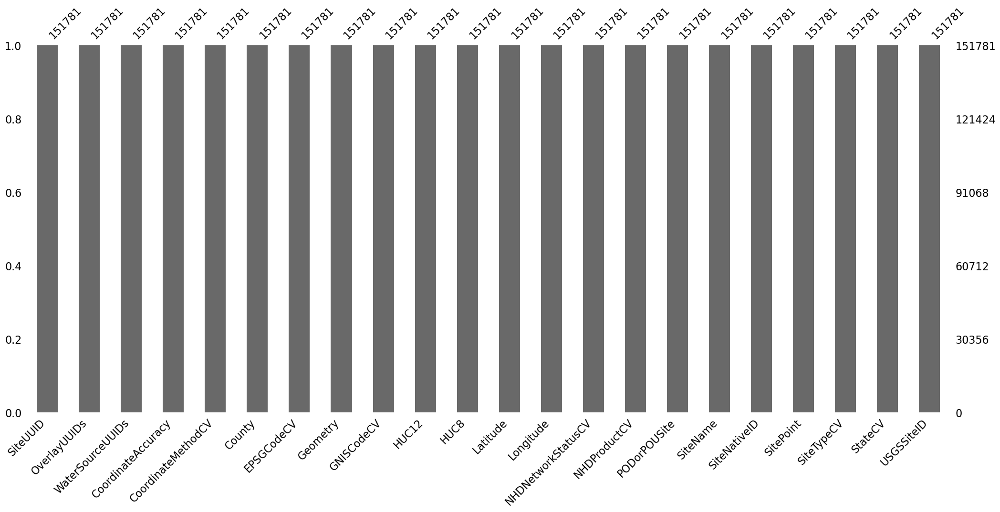

In [11]:
# Check what columns contain missing information.
msno.bar(dfs)

In [12]:
# Unique values for 'CoordinateMethodCV'
for x in dfs['CoordinateMethodCV'].sort_values().unique():
    print(f'"' + x + '",')

"WaDE Blank",


In [13]:
# Unique values for 'SiteTypeCV'
for x in dfs['SiteTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"Ground Water Collector",
"Headworks Gravity Flow (or surface water device unknown)",
"Irrigation Dam",
"Monitoring Well",
"Reservoir Dam",
"Surface Water Pump",
"WaDE Blank",
"Well (or ground water device unknown)",


# Allocation Amount Info (waterallocations.csv)

In [14]:
print(len(dfaa))
dfaa.head(1)

86867


,AllocationUUID,MethodUUID,OrganizationUUID,SiteUUID,VariableSpecificUUID,AllocationApplicationDate,AllocationAssociatedConsumptiveUseSiteIDs,AllocationAssociatedWithdrawalSiteIDs,AllocationBasisCV,AllocationChangeApplicationIndicator,AllocationCommunityWaterSupplySystem,AllocationCropDutyAmount,AllocationExpirationDate,AllocationFlow_CFS,AllocationLegalStatusCV,AllocationNativeID,AllocationOwner,AllocationPriorityDate,AllocationSDWISIdentifierCV,AllocationTimeframeEnd,AllocationTimeframeStart,AllocationTypeCV,AllocationVolume_AF,BeneficialUseCategory,CommunityWaterSupplySystem,CropTypeCV,CustomerTypeCV,DataPublicationDate,DataPublicationDOI,ExemptOfVolumeFlowPriority,GeneratedPowerCapacityMW,IrrigatedAcreage,IrrigationMethodCV,LegacyAllocationIDs,OwnerClassificationCV,PopulationServed,PowerType,PrimaryBeneficialUseCategory,WaterAllocationNativeURL
0,WAwr_WRwa2032170,WAwr_M1,WAwr_O1,"WAwr_SPOD514563,WAwr_SwadeID29476",WAwr_V1,,,,WaDE Blank,,,,,0.02000,Active,wa2032170,Mellemark Inc,1996-02-15,,,,Certificate,0.50000,Domestic single,,,,12/11/2025,,0,,0.00000,,,Private,,,Domestic,https://appswr.ecology.wa.gov/waterrighttracki...


<Axes: >

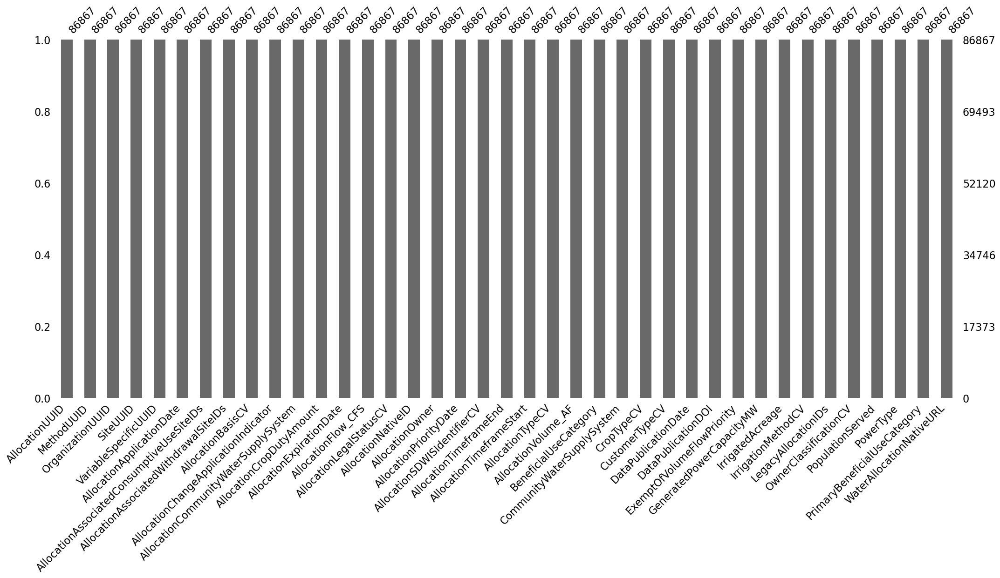

In [15]:
# Check what columns contain missing information.
msno.bar(dfaa)

In [16]:
# Unique values for 'AllocationBasisCV'
for x in dfaa['AllocationBasisCV'].sort_values().unique():
    print(f'"' + str(x) + '",')

"WaDE Blank",


In [17]:
# Unique values for 'AllocationTypeCV'
for x in dfaa['AllocationTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"AdjudicatedCertificate",
"Certificate",
"CertificateOfChange",
"ChangeApplication",
"ChangeROE",
"Claim",
"ClaimAmendment",
"DroughtAuthorization",
"MitigatedPermit",
"NewApp",
"Permit",
"PreApp",
"QuincyBasinPermit",
"ROE",
"ShortTerm",
"SupersedingAdjudicatedCert",
"SupersedingCertificate",
"SupersedingCertificateOfChange",
"SupersedingPermit",
"SupersedingQuincyBasinPermit",
"TemporaryDonation",
"TemporaryUse",


In [18]:
# Unique values for 'AllocationLegalStatusCV'
for x in dfaa['AllocationLegalStatusCV'].sort_values().unique():
    print(f'"' + x + '",')

"Active",
"ChangeInProgress",
"InTrustTemp",


In [19]:
# Unique values for 'BeneficialUseCategory'
uniqueList = list(set([i.strip() for i in ','.join(dfaa['BeneficialUseCategory'].astype(str)).split(',')]))
uniqueList.sort()
uniqueList

['Commercial & indust',
 'Cooling for indust proces',
 'Dairy',
 'Domestic general',
 'Domestic multiple',
 'Domestic single',
 'Dust Control',
 'Environmental quality',
 'Fire protection',
 'Fish propagation',
 'Frost protection',
 'Groundwater Preservation',
 'Heat Exchange',
 'Heat protection for crops',
 'Highway',
 'Instream Flow',
 'Irrigation',
 'Mining',
 'Mitigation',
 'Municipal',
 'No Purpose Identified',
 'Other',
 'Power',
 'Railway',
 'Recreation - beautification',
 'Stock water',
 'Storage',
 'Stream augmentation',
 'WaDE Blank',
 'Wildlife refuge']

In [20]:
# Unique values for 'OwnerClassificationCV'
for x in dfaa['OwnerClassificationCV'].sort_values().unique():
    print(f'"' + x + '",')

"Bureau Reclamation (USBR)",
"Bureau of Indian Affairs (USBIA)",
"Bureau of Land Management (USBLM)",
"Department of Agriculture (USDA)",
"Department of Energy (USDOE)",
"Fish and Wildlife Service (USFWS)",
"Forest Service (USFS)",
"Military",
"National Park Service (USNPS)",
"Native American",
"Private",
"Reclamation Contractor",
"United States of America",
"Unspecified",


## Markdown Table Creation

In [21]:
# method.csv
try:
  dftmp = dfm.loc[[0]].drop(['MethodDescription'], axis=1).copy().to_markdown()
except:
  dftmp = dfm.drop(['MethodDescription'], axis=1).copy().to_markdown()
print(dftmp)

|    | MethodUUID   | ApplicableResourceTypeCV      | DataConfidenceValue   | DataCoverageValue   | DataQualityValueCV   | MethodName                     | MethodNEMILink                                                    | MethodTypeCV    | WaDEDataMappingUrl                                                                                         |
|---:|:-------------|:------------------------------|:----------------------|:--------------------|:---------------------|:-------------------------------|:------------------------------------------------------------------|:----------------|:-----------------------------------------------------------------------------------------------------------|
|  0 | WAwr_M1      | Surface Water and Groundwater |                       |                     |                      | Washington Water Rights Method | https://ecology.wa.gov/Water-Shorelines/Water-supply/Water-rights | Legal Processes | https://github.com/WSWCWaterDataExchange/MappingStatesDa

In [22]:
# variable.csv
try:
  dftmp = dfv.loc[[0]].copy().to_markdown()
except:
  dftmp = dfv.copy().to_markdown()
print(dftmp)

|    | VariableSpecificUUID   |   AggregationInterval | AggregationIntervalUnitCV   | AggregationStatisticCV   | AmountUnitCV   | MaximumAmountUnitCV   |   ReportYearStartMonth | ReportYearTypeCV   | VariableCV   | VariableSpecificCV   |
|---:|:-----------------------|----------------------:|:----------------------------|:-------------------------|:---------------|:----------------------|-----------------------:|:-------------------|:-------------|:---------------------|
|  0 | WAwr_V1                |                     1 | Year                        | Average                  | CFS            | AFY                   |                     10 | WaterYear          | Allocation   | Allocation           |


In [23]:
# organizations.csv
try:
  dftmp = dfo.loc[[0]].copy().to_markdown()
except:
  dftmp = dfo.copy().to_markdown()
print(dftmp)

|    | OrganizationUUID   | OrganizationContactEmail   | OrganizationContactName   | OrganizationName                       | OrganizationPhoneNumber   | OrganizationPurview                                                                                                                               | OrganizationWebsite                                               | State   |
|---:|:-------------------|:---------------------------|:--------------------------|:---------------------------------------|:--------------------------|:--------------------------------------------------------------------------------------------------------------------------------------------------|:------------------------------------------------------------------|:--------|
|  0 | WAwr_O1            | HRID461@ECY.WA.GOV         | Riddle, H. Nicholas       | Washington State Department of Ecology | 360-407-6000              | The Water Resources' GWIS (Geographic Water Information System) database includes wate

In [24]:
# watersources.csv
try:
  dftmp = dfws.loc[[0]].copy().to_markdown()
except:
  dftmp = dfws.copy().to_markdown()
print(dftmp)

|    | WaterSourceUUID   | Geometry   | GNISFeatureNameCV   | WaterQualityIndicatorCV   | WaterSourceName   | WaterSourceNativeID   | WaterSourceTypeCV   |
|---:|:------------------|:-----------|:--------------------|:--------------------------|:------------------|:----------------------|:--------------------|
|  0 | WAwr_WwadeId1     |            |                     | Fresh                     | WaDE Blank        | wadeId1               | Groundwater         |


In [25]:
# sites.csv
try:
  dftmp = dfs.loc[[0]].drop(['Geometry'], axis=1).copy().to_markdown()
except:
  dftmp = dfs.drop(['Geometry'], axis=1).copy().to_markdown()
print(dftmp)

|    | SiteUUID        | OverlayUUIDs   | WaterSourceUUIDs   | CoordinateAccuracy          | CoordinateMethodCV   | County   |   EPSGCodeCV | GNISCodeCV   |        HUC12 |     HUC8 |   Latitude |   Longitude | NHDNetworkStatusCV   | NHDProductCV   | PODorPOUSite   | SiteName   | SiteNativeID   | SitePoint   | SiteTypeCV         | StateCV   | USGSSiteID   |
|---:|:----------------|:---------------|:-------------------|:----------------------------|:---------------------|:---------|-------------:|:-------------|-------------:|---------:|-----------:|------------:|:---------------------|:---------------|:---------------|:-----------|:---------------|:------------|:-------------------|:----------|:-------------|
|  0 | WAwr_SPOD100002 |                | WAwr_WwadeId2      | field checked (without GPS) | WaDE Blank           | King     |         4326 |              | 171100120400 | 17110012 |    47.6507 |     -122.22 |                      |                | POD            | WaDE Blank | PO

In [26]:
# waterallocations.csv
try:
  dftmp = dfaa.loc[[0]].copy().to_markdown()
except:
  dftmp = dfaa.copy().to_markdown()
print(dftmp)

|    | AllocationUUID   | MethodUUID   | OrganizationUUID   | SiteUUID                          | VariableSpecificUUID   | AllocationApplicationDate   | AllocationAssociatedConsumptiveUseSiteIDs   | AllocationAssociatedWithdrawalSiteIDs   | AllocationBasisCV   | AllocationChangeApplicationIndicator   | AllocationCommunityWaterSupplySystem   | AllocationCropDutyAmount   | AllocationExpirationDate   |   AllocationFlow_CFS | AllocationLegalStatusCV   | AllocationNativeID   | AllocationOwner   | AllocationPriorityDate   | AllocationSDWISIdentifierCV   | AllocationTimeframeEnd   | AllocationTimeframeStart   | AllocationTypeCV   |   AllocationVolume_AF | BeneficialUseCategory   | CommunityWaterSupplySystem   | CropTypeCV   | CustomerTypeCV   | DataPublicationDate   | DataPublicationDOI   |   ExemptOfVolumeFlowPriority | GeneratedPowerCapacityMW   |   IrrigatedAcreage | IrrigationMethodCV   | LegacyAllocationIDs   | OwnerClassificationCV   | PopulationServed   | PowerType   | PrimaryBeneficia

## Num of Record Summary

In [27]:
# Num of entries of source data
print(f"Num of Source #1 Entries (rows): ", "|", len(dfin1))
print(f"Num of Source #2 Entries (rows): ", "|", len(dfin2))

Num of Source #1 Entries (rows):  | 164832
Num of Source #2 Entries (rows):  | 163575


In [28]:
# Num of entries compiled into WaDE
podString =  len(dfs[dfs['PODorPOUSite'] == 'POD'])
pouString=  len(dfs[dfs['PODorPOUSite'] == 'POU'])
aaString = len(dfaa)
print("Dataset  | Num of Identified PODs | Num of Identified POUs | Num of Identified Water Right Records")
print("**Compiled WaDE Data** |", podString, "|", pouString, "|", aaString)

Dataset  | Num of Identified PODs | Num of Identified POUs | Num of Identified Water Right Records
**Compiled WaDE Data** | 63205 | 88576 | 86867


## Why Removed Records Summary

In [29]:
print("---- Reasons why records were removed from water source info ----")
if len(dfwspurge) != 0:
    print(dfwspurge['ReasonRemoved'].value_counts().astype(str) + " | removed from watersources.csv input")
else:
    print("...nothing removed.")

---- Reasons why records were removed from water source info ----
...nothing removed.


In [30]:
print(" ---- Reasons why records were removed from site info ---- ")
if len(dfspurge) != 0:
    print(dfspurge['ReasonRemoved'].value_counts().astype(str) + " | removed from sites.csv input")
else:
    print("...nothing removed.")

 ---- Reasons why records were removed from site info ---- 
ReasonRemoved
Unused Site Record                       133424 | removed from sites.csv input
Incomplete or bad entry for Latitude         28 | removed from sites.csv input
Incomplete or bad entry for Longitude         1 | removed from sites.csv input
Name: count, dtype: object


In [31]:
print(" ---- Reasons why records were removed from allocation amount info ---- ")
if len(dfaapurge) != 0:
    print(dfaapurge['ReasonRemoved'].value_counts().astype(str) + " | removed from waterallocations.csv input")
else:
    print("...nothing removed.")

 ---- Reasons why records were removed from allocation amount info ---- 
ReasonRemoved
Incomplete or bad entry for AllocationPriorityDate    72444 | removed from waterallocations.csv input
Incomplete or bad entry for Volume                      367 | removed from waterallocations.csv input
Incomplete or bad entry for Flow                        285 | removed from waterallocations.csv input
Incomplete or bad entry for SiteUUID                    103 | removed from waterallocations.csv input
Incomplete or bad entry for IrrigatedAcreage             61 | removed from waterallocations.csv input
Incomplete or bad entry for AllocationOwner               1 | removed from waterallocations.csv input
Name: count, dtype: object


## Figures

In [32]:
# ---- merge watersource.csv to sites.csv ----

# explode site.csv on WaterSourceUUIDs
dfstemp = dfs.copy()
dfstemp = dfstemp.assign(WaterSourceUUIDs=dfstemp['WaterSourceUUIDs'].str.split(',')).explode('WaterSourceUUIDs').reset_index(drop=True)

# merge
dfstemp_ws = pd.merge(dfstemp, dfws[['WaterSourceUUID', 'WaterSourceTypeCV']], left_on='WaterSourceUUIDs', right_on='WaterSourceUUID', how='left')

# groupby site-watersource.csv via SiteUUID
dfstemp_ws = dfstemp_ws.groupby('SiteUUID').agg(lambda x: ','.join([str(elem) for elem in (list(set(x))) if elem != ""])).replace(np.nan, "").reset_index()

print(len(dfstemp_ws))
dfstemp_ws.head(1)

151781


,SiteUUID,OverlayUUIDs,WaterSourceUUIDs,CoordinateAccuracy,CoordinateMethodCV,County,EPSGCodeCV,Geometry,GNISCodeCV,HUC12,HUC8,Latitude,Longitude,NHDNetworkStatusCV,NHDProductCV,PODorPOUSite,SiteName,SiteNativeID,SitePoint,SiteTypeCV,StateCV,USGSSiteID,WaterSourceUUID,WaterSourceTypeCV
0,WAwr_SPOD100002,,WAwr_WwadeId2,field checked (without GPS),WaDE Blank,King,4326,,,171100120400,17110012,47.6507,-122.22,,,POD,WaDE Blank,POD100002,,Surface Water Pump,WA,,WAwr_WwadeId2,Surface Water


In [33]:
# ---- Histogram: Num of POD sites vs POU sites ----
print(dfstemp_ws.PODorPOUSite.value_counts())

fig = px.histogram(dfstemp_ws, x="PODorPOUSite", text_auto=True)
fig.update_layout(bargap=0.2,
                  title="Histogram of PODorPOUSite Entries in sites.csv",
                  xaxis_title="PODorPOUSite Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/PODorPOUSite.png', engine="kaleido")

PODorPOUSite
POU    88576
POD    63205
Name: count, dtype: int64


C:\Users\rjame\AppData\Local\Temp\ipykernel_20160\1965001943.py:16: DeprecationWarning:


Support for the 'engine' argument is deprecated and will be removed after September 2025.
Kaleido will be the only supported engine at that time.




In [34]:
# ---- Histogram: Num of sites via WatersourceTypeCV ----
print(dfstemp_ws.WaterSourceTypeCV.value_counts())

fig = px.histogram(dfstemp_ws, x="WaterSourceTypeCV", text_auto=True)
fig.update_layout(bargap=0.2,
                  title="Histogram of WaterSourceTypeCV Entries in sites.csv",
                  xaxis_title="WaterSourceTypeCV Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/WaterSourceTypeCV.png', engine="kaleido")

WaterSourceTypeCV
Groundwater                                   86296
Surface Water                                 64510
Reservoir                                       778
Surface Water,Groundwater                       159
Reservoir,Surface Water                          18
WaDE Unspecified,Groundwater                     11
WaDE Unspecified,Surface Water                    4
Reservoir,Groundwater                             3
Surface Water,Groundwater,WaDE Unspecified        2
Name: count, dtype: int64


C:\Users\rjame\AppData\Local\Temp\ipykernel_20160\1738051229.py:16: DeprecationWarning:


Support for the 'engine' argument is deprecated and will be removed after September 2025.
Kaleido will be the only supported engine at that time.




In [35]:
# ---- Histogram: Distribution of PrimaryBeneficialUseCategory WaDE Values ----
print(dfaa.PrimaryBeneficialUseCategory.value_counts())

fig = px.histogram(dfaa, x="PrimaryBeneficialUseCategory", text_auto=True)
fig.update_layout(bargap=0.2,
                  title="Histogram of WaDE PrimaryBeneficialUseCategory Entries in waterallocations.csv",
                  xaxis_title="PrimaryBeneficialUseCategory Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/PrimaryBeneficialUseCategory.png', engine="kaleido")

PrimaryBeneficialUseCategory
Agriculture Irrigation    41584
Domestic                  24215
Livestock                 13585
Public Supply              2200
Commercial/Industrial      1432
Aquaculture                1012
Unspecified                 589
Fire                        540
In-stream Flow              518
Other                       319
Hydroelectric               280
Recreation                  174
Thermoelectric Cooling      130
Reservoir Storage           110
Aquifer Recharge            106
Mining                       73
Name: count, dtype: int64


C:\Users\rjame\AppData\Local\Temp\ipykernel_20160\3144699730.py:16: DeprecationWarning:


Support for the 'engine' argument is deprecated and will be removed after September 2025.
Kaleido will be the only supported engine at that time.




In [36]:
# ---- AllocationPriorityDate #1: histogram distribution of WaDE values 
print(dfaa.AllocationPriorityDate.value_counts())

dfaatemp = dfaa.copy()
dfaatemp = dfaatemp[(dfaatemp['ExemptOfVolumeFlowPriority'] < 1)].reset_index(drop=True)
fig = px.histogram(dfaatemp, x="AllocationPriorityDate")
fig.update_layout(bargap=0.2,
                  title="Histogram of AllocationPriorityDate Entries in waterallocations.csv",
                  xaxis_title="AllocationPriorityDate Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/AllocationPriorityDate1.png', engine="kaleido")

AllocationPriorityDate
1900-01-01    1071
1889-11-11     984
2002-06-28     980
1974-06-30     922
1901-01-01     767
              ... 
2023-11-02       1
2023-10-30       1
2023-01-09       1
2023-10-19       1
2023-10-23       1
Name: count, Length: 17811, dtype: int64


C:\Users\rjame\AppData\Local\Temp\ipykernel_20160\3323753691.py:18: DeprecationWarning:


Support for the 'engine' argument is deprecated and will be removed after September 2025.
Kaleido will be the only supported engine at that time.




In [37]:
# ---- AllocationPriorityDate #2: cumulative distribution of WaDE values 
print(dfaa.AllocationPriorityDate.value_counts())

dfaatemp = dfaa.copy()
dfaatemp = dfaatemp[(dfaatemp['ExemptOfVolumeFlowPriority'] < 1)].reset_index(drop=True)
fig = px.ecdf(dfaatemp, x="AllocationPriorityDate", ecdfnorm=None)
fig.update_layout(bargap=0.2,
                  title="Cumulative Distribution of AllocationPriorityDate Entries in waterallocations.csv",
                  xaxis_title="AllocationPriorityDate Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/AllocationPriorityDate2.png', engine="kaleido")

AllocationPriorityDate
1900-01-01    1071
1889-11-11     984
2002-06-28     980
1974-06-30     922
1901-01-01     767
              ... 
2023-11-02       1
2023-10-30       1
2023-01-09       1
2023-10-19       1
2023-10-23       1
Name: count, Length: 17811, dtype: int64


C:\Users\rjame\AppData\Local\Temp\ipykernel_20160\1508418406.py:18: DeprecationWarning:


Support for the 'engine' argument is deprecated and will be removed after September 2025.
Kaleido will be the only supported engine at that time.




In [38]:
# ---- AllocationLegalStatusCV: histogram distribution of WaDE values ----
print(dfaa.AllocationLegalStatusCV.value_counts())

fig = px.histogram(dfaa, x="AllocationLegalStatusCV", text_auto=True)
fig.update_layout(bargap=0.2,
                  title="Histogram of AllocationLegalStatusCV Entries in waterallocations.csv",
                  xaxis_title="AllocationLegalStatusCV Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/AllocationLegalStatusCV.png', engine="kaleido")

AllocationLegalStatusCV
Active              86215
ChangeInProgress      380
InTrustTemp           272
Name: count, dtype: int64


C:\Users\rjame\AppData\Local\Temp\ipykernel_20160\4104672489.py:16: DeprecationWarning:


Support for the 'engine' argument is deprecated and will be removed after September 2025.
Kaleido will be the only supported engine at that time.




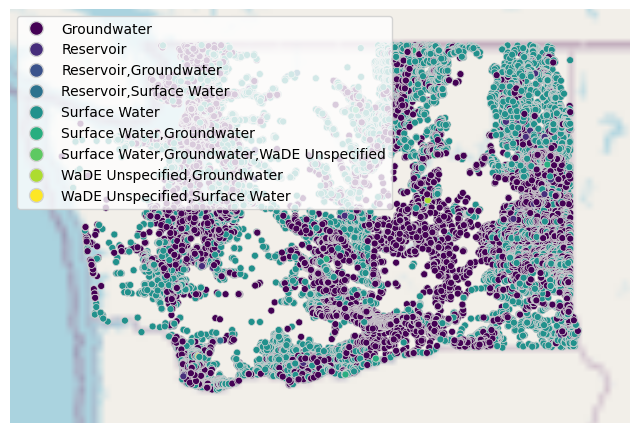

In [39]:
# ---- Map of Points sites ----

dfstemp = dfstemp_ws.copy()
dfstemp = dfstemp[dfstemp['Geometry'] == ''].reset_index(drop=True)

try:
    contiguous_usa = gpd.read_file(gplt.datasets.get_path('contiguous_usa')) # use for background map in subplot
    ax = gplt.webmap(contiguous_usa, projection=gcrs.WebMercator()) # set subplot
    gdfstemp = gpd.GeoDataFrame(dfstemp, geometry=gpd.points_from_xy(dfstemp.Longitude.astype(float), dfstemp.Latitude.astype(float)), crs="EPSG:4326")
    gplt.pointplot(gdfstemp, hue='WaterSourceTypeCV', edgecolor='lightgray', linewidth=0.5, legend=True, legend_var='hue', ax=ax)
    mplt.savefig(format="png", fname='figures/PointMap.png') 
except:
    print('No point data to plot')

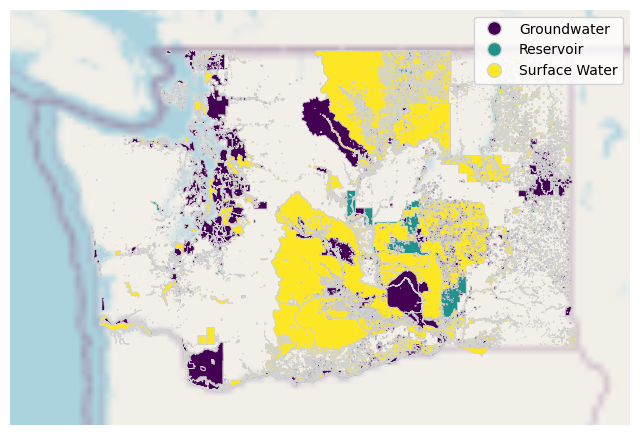

In [40]:
# ---- Map of Polygons ----

dfstemp = dfstemp_ws.copy()
dfstemp = dfstemp[dfstemp['Geometry'] != ""].reset_index(drop=True)

try:
    contiguous_usa = gpd.read_file(gplt.datasets.get_path('contiguous_usa')) # use for background map in subplot
    ax = gplt.webmap(contiguous_usa, projection=gcrs.WebMercator()) # set subplot

    dfstemp['Geometry'] = gpd.GeoSeries.from_wkt(dfstemp['Geometry'], crs="EPSG:4326")
    gdfstemp = gpd.GeoDataFrame(dfstemp, geometry=dfstemp['Geometry'], crs="EPSG:4326") # covert to geodataframe
    gplt.choropleth(gdfstemp, edgecolor='lightgray', linewidth=0.5, hue='WaterSourceTypeCV', legend=True, ax=ax)
    mplt.savefig(format="png", fname='figures/PolyMap.png')
except:
    print('No geometry data to plot')

### Allocation CFS, allocation AF, & Water Use Amount

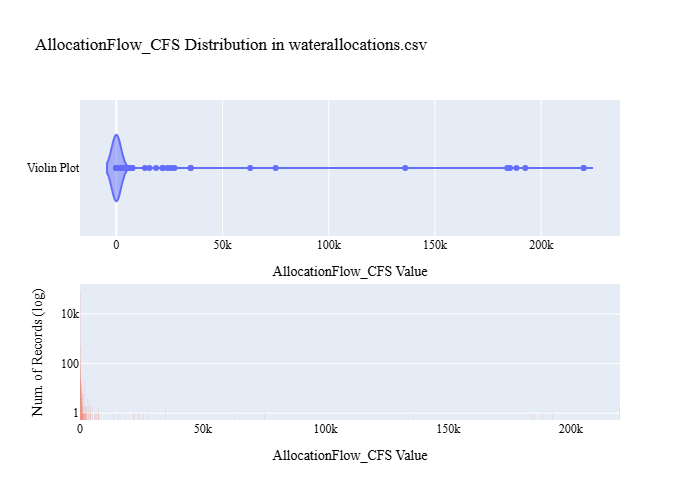

C:\Users\rjame\AppData\Local\Temp\ipykernel_20160\2804319279.py:16: DeprecationWarning:


Support for the 'engine' argument is deprecated and will be removed after September 2025.
Kaleido will be the only supported engine at that time.




In [41]:
# ---- AllocationFlow_CFS: Boxplot distribution of WaDE values ----

try: 
    trace1 = go.Violin(x=dfaa['AllocationFlow_CFS'], points='outliers', name='Violin Plot')
    trace2 = go.Histogram(x=dfaa['AllocationFlow_CFS'], name='Historgram')

    fig = make_subplots(rows=2, cols=1)
    fig.add_trace(trace1, row=1, col=1)
    fig.add_trace(trace2, row=2, col=1)

    fig.update_layout(showlegend=False, bargap=0.2, title="AllocationFlow_CFS Distribution in waterallocations.csv", font=dict(family="Arial Bold", size=12,color="Black"))
    fig.update_xaxes(title_text="AllocationFlow_CFS Value", row=1, col=1)
    fig.update_xaxes(title_text="AllocationFlow_CFS Value", row=2, col=1)
    fig.update_yaxes(title_text="Num. of Records (log)", row=2, col=1, type="log")
    fig.show(renderer="png")
    fig.write_image('figures/AllocationFlow_CFS.png', engine="kaleido")

except: print('Could not plot AllocationFlow_CFS value.')

In [42]:
# ---- Amount: Boxplot distribution of WaDE values ----

try: 
    trace1 = go.Violin(x=dfsa['Amount'], points='outliers', name='Violin Plot')
    trace2 = go.Histogram(x=dfsa['Amount'], name='Historgram')

    fig = make_subplots(rows=2, cols=1)
    fig.add_trace(trace1, row=1, col=1)
    fig.add_trace(trace2, row=2, col=1)

    fig.update_layout(showlegend=False, bargap=0.2, title="Amount Distribution in sitespecificamounts.csv", font=dict(family="Arial Bold", size=12,color="Black"))
    fig.update_xaxes(title_text="Amount Value", row=1, col=1)
    fig.update_xaxes(title_text="Amount Value", row=2, col=1)
    fig.update_yaxes(title_text="Num. of Records (log)", row=2, col=1, type="log")
    fig.show(renderer="png")
    fig.write_image('figures/Amount.png', engine="kaleido")

except: print('Could not plot Amount value.')

Could not plot Amount value.


# Removed Records compared to Source Data
- this is working just fine, just want to comment out temporarily for future use

In [43]:
# # Explode purge.xlsx files by WaDEUUID, concat together
# #################################################################

# # Explode watersources_missing.xlsx records by WaDEUUID
# dfwspurgeCopy = dfwspurge.assign(WaDEUUID=dfwspurge['WaDEUUID'].str.split(',')).explode('WaDEUUID').reset_index(drop=True)
# dfwspurgeCopy = dfwspurgeCopy[['WaDEUUID','ReasonRemoved','IncompleteField']]

# # Explode sites_missing.xlsx records by WaDEUUID
# dfspurgeCopy = dfspurge.assign(WaDEUUID=dfspurge['WaDEUUID'].str.split(',')).explode('WaDEUUID').reset_index(drop=True)
# dfspurgeCopy = dfspurgeCopy[['WaDEUUID','ReasonRemoved','IncompleteField']]

# # Explode waterallocations_missing.xlsx records by WaDEUUID
# dfaapurgeCopy = dfaapurge.assign(WaDEUUID=dfaapurge['WaDEUUID'].str.split(',')).explode('WaDEUUID').reset_index(drop=True)
# dfaapurgeCopy = dfaapurgeCopy[['WaDEUUID','ReasonRemoved','IncompleteField']]

# # concat purge dataframes togehter
# frames = [dfwspurgeCopy, dfspurgeCopy, dfaapurgeCopy] 
# dfWaDEUUID = pd.concat(frames)
# dfWaDEUUID = dfWaDEUUID.drop_duplicates().reset_index(drop=True).replace(np.nan, "")
# print(len(dfWaDEUUID))
# dfWaDEUUID.head(1)

# Custom Queries and Analysis for this Dataset

In [44]:
# N/A